# Task 2: Predicting the Finalist Teams and Players
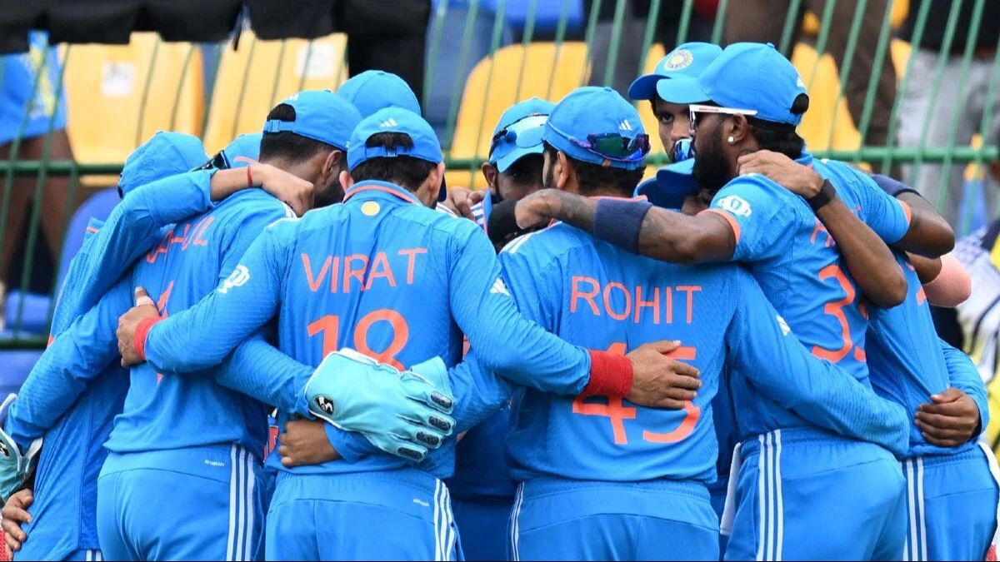

### Here it is assumed that Finalist teams will be Team INDIA and Team South Africa

## About The Dataset

I have crafted a custom dataset derived from ODI (One Day International) cricket matches, meticulously extracted and organized from the comprehensive cricketing data available on cricsheet.org. I have used modified script from Aadita Agarwal's [GitHub](https://github.com/aaditagarwal) to convert YAML to excel format.


### **Features**

#### Dataset 1 - Batsman:
**player_name**: Name of the player (batsman).<br>
**team:** Name of the team player belongs to.<br>
**innings:** The number of times the player has batted in matches, representing their opportunities to score runs.<br>
**runs:** The total number of runs scored by the batsman across all their innings, indicating their overall batting performance.<br>
**balls:** The total number of deliveries faced by the batsman, reflecting their involvement and time spent at the crease.<br>
**average:** The mean value of runs scored per dismissal, offering a measure of the batsman's consistency and effectiveness.<br>
**strike_rate:** The speed at which the batsman scores runs, calculated as the number of runs scored per 100 balls faced.<br>
**centuries:** The number of times the batsman has scored 100 or more runs in a single inning, highlighting their ability to achieve high scores.<br>
**fifties:** The number of times the batsman has scored between 50 and 99 runs in a single inning, showcasing consistent half-century performances.<br>
**zeros:** The number of times the batsman has been dismissed without scoring any runs, indicating instances of unsuccessful innings.


#### Dataset 2-Bowler:
**player_name:** Name of the player (batsman).<br>
**team:** Name of the team player belongs to.<br>
**innings:** The number of times the player has bowled in matches, representing their opportunities to take wickets.<br>
 **runs:** The total number of runs conceded by the bowler, reflecting their effectiveness in limiting the opposition's scoring.<br>
 **balls:** The total number of deliveries bowled by the player, indicating their workload and contribution to the team's bowling efforts.<br>
 **wickets:** The total number of wickets taken by the bowler, showcasing their ability to dismiss opposing batsmen.<br>
 **extras:** Additional runs conceded through no-balls, wides, and byes, contributing to the overall runs given away by the bowler.<br>
 **average:** The mean value of runs conceded per wicket taken, providing a measure of the bowler's effectiveness in getting dismissals.<br>
 **strike_rate:** The rate at which the bowler takes wickets, calculated as the number of balls bowled per wicket taken.<br>
 **economy:** The average number of runs conceded per over bowled, indicating the bowler's ability to control the scoring rate.<br>
 **wicket_hauls:** The number of times the bowler has taken a specified number of wickets in a single inning, highlighting exceptional bowling performances.<br>


### Dataset 3-Custom:
This dataset has been created especially to help predict the 11 members of each team for the ICC World Cup Finals.

**date:** The date of the Match<br>
**player_name:** The name of the player<br>
**team:** The team player belongs to.<br>
**opposition:** The opposition team of the player's team.<br>
**venue:** The location(In India) where the match took place.<br>
**player_rating:** The player's ICC Rankings for ODI fetched from [here](https://www.icc-cricket.com/rankings/mens/player-rankings/odi).<br>
**selected:** A boolean value which determines if the player played in The play-in 11 or not.

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df_overall_batsman = pd.read_excel("overall_batsman_details.xlsx")
df_overall_bowler = pd.read_excel("overall_bowler_details.xlsx")

In [ ]:
df_overall_batsman.head(5)

,player_name,team,innings,runs,balls,average,strike_rate,centuries,fifties,zeros
0,JM Bairstow,England,8,156,184,19.500,69.498807,0,1,1
1,DJ Malan,England,8,373,377,46.625,86.240860,1,2,0
2,JE Root,England,8,216,244,27.000,60.525427,0,2,1
3,HC Brook,England,5,139,134,27.800,106.556989,0,1,0
4,MM Ali,England,5,87,125,17.400,64.649642,0,0,0


In [ ]:
df_overall_batsman.columns

Index(['player_name', 'team', 'innings', 'runs', 'balls', 'average',
       'strike_rate', 'centuries', 'fifties', 'zeros'],
      dtype='object')

In [ ]:
batsman_features = df_overall_batsman.columns.to_list()
batsman_features

['player_name',
 'team',
 'innings',
 'runs',
 'balls',
 'average',
 'strike_rate',
 'centuries',
 'fifties',
 'zeros']

In [ ]:
df_overall_batsman.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144 entries, 0 to 143
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   player_name  144 non-null    object 
 1   team         144 non-null    object 
 2   innings      144 non-null    int64  
 3   runs         144 non-null    int64  
 4   balls        144 non-null    int64  
 5   average      144 non-null    float64
 6   strike_rate  144 non-null    float64
 7   centuries    144 non-null    int64  
 8   fifties      144 non-null    int64  
 9   zeros        144 non-null    int64  
dtypes: float64(2), int64(6), object(2)
memory usage: 11.4+ KB


Here, the dataset is clean and does not require additional Data Cleaning.

## Data Visualization - Batsman

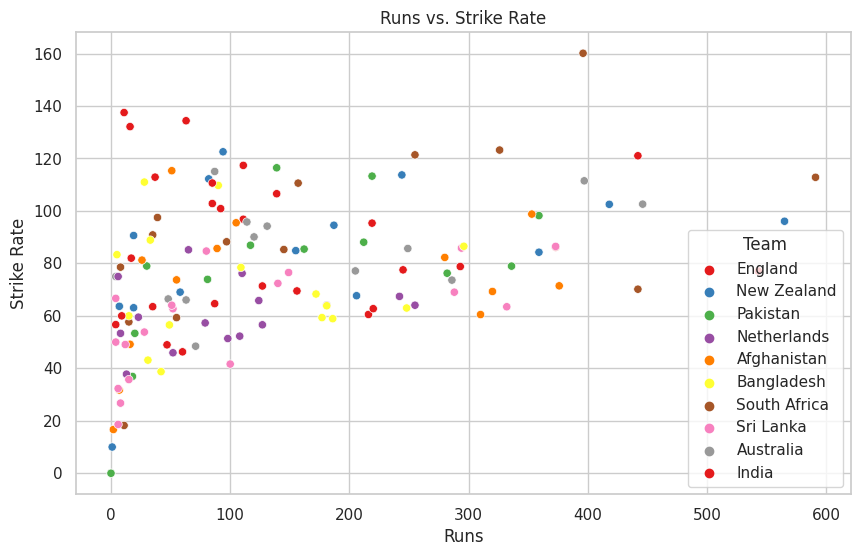

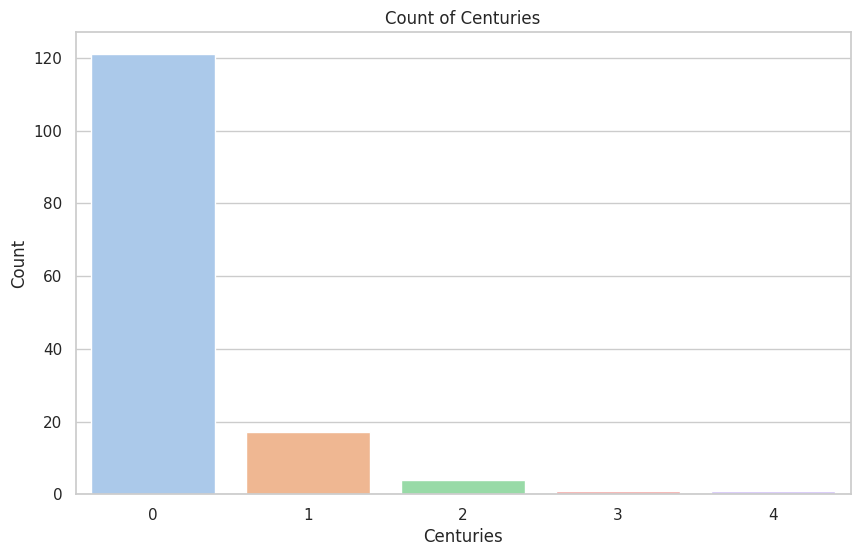

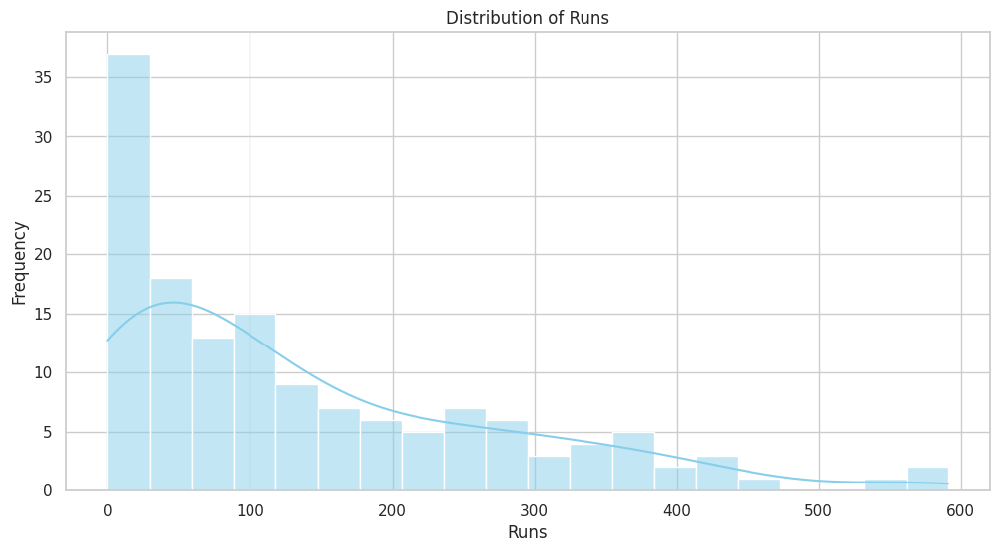

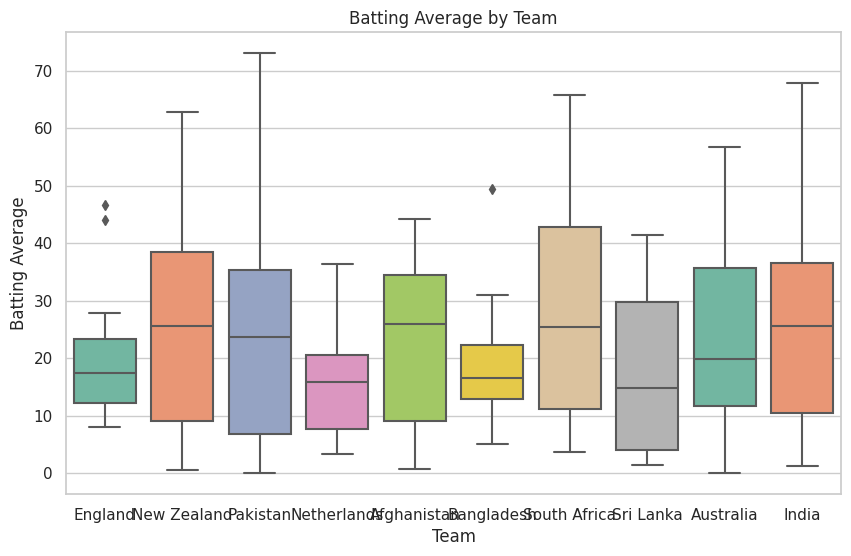

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for Seaborn plots
sns.set(style="whitegrid")

#Scatter Plot for Runs vs. Strike Rate
plt.figure(figsize=(10, 6))
sns.scatterplot(x='runs', y='strike_rate', data=df_overall_batsman, hue='team', palette='Set1')
plt.title('Runs vs. Strike Rate')
plt.xlabel('Runs')
plt.ylabel('Strike Rate')
plt.legend(title='Team')
plt.show()

#Bar Plot for Centuries
plt.figure(figsize=(10, 6))
sns.countplot(x='centuries', data=df_overall_batsman, palette='pastel')
plt.title('Count of Centuries')
plt.xlabel('Centuries')
plt.ylabel('Count')
plt.show()

#Histogram for Runs
plt.figure(figsize=(12, 6))
sns.histplot(df_overall_batsman['runs'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of Runs')
plt.xlabel('Runs')
plt.ylabel('Frequency')
plt.show()

#Box Plot for Average
plt.figure(figsize=(10, 6))
sns.boxplot(x='team', y='average', data=df_overall_batsman, palette='Set2')
plt.title('Batting Average by Team')
plt.xlabel('Team')
plt.ylabel('Batting Average')
plt.show()

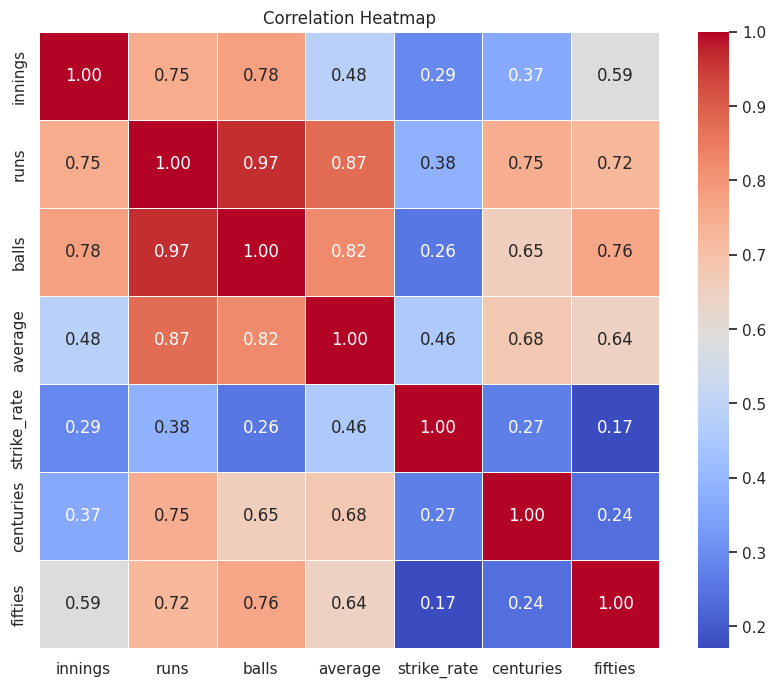

In [ ]:
#Heatmap for Correlation
plt.figure(figsize=(10, 8))
correlation_matrix = df_overall_batsman[['innings', 'runs', 'balls', 'average', 'strike_rate', 'centuries', 'fifties']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()


As we need play in eleven team members for Team India and Team South Africa, we will do comparitive analysis between the batsmen of respective teams.

In [ ]:
indian_batsman = df_overall_batsman[df_overall_batsman['team']=='India']
southAfrican_batsman = df_overall_batsman[df_overall_batsman['team']=='South Africa']

In [ ]:
print(indian_batsman)
print(southAfrican_batsman)

        player_name   team  innings  runs  balls    average  strike_rate  \
82        RG Sharma  India        8   442    365  55.250000   121.027658   
83     Ishan Kishan  India        2    47     49  23.500000    48.958333   
84          V Kohli  India        8   543    633  67.875000    77.073791   
85          SS Iyer  India        8   293    308  36.625000    78.804792   
86         KL Rahul  India        7   245    310  35.000000    77.531978   
87        HH Pandya  India        1    11      8  11.000000   137.500000   
110    Shubman Gill  India        6   219    233  36.500000    95.350434   
125        SA Yadav  India        4    85     75  21.250000   110.639881   
126       RA Jadeja  India        4   111     99  27.750000   117.363782   
127  Mohammed Shami  India        3     4     10   1.333333    56.666667   
135       JJ Bumrah  India        2    17     26   8.500000    82.000000   
136   Kuldeep Yadav  India        1     9     15   9.000000    60.000000   

     centur

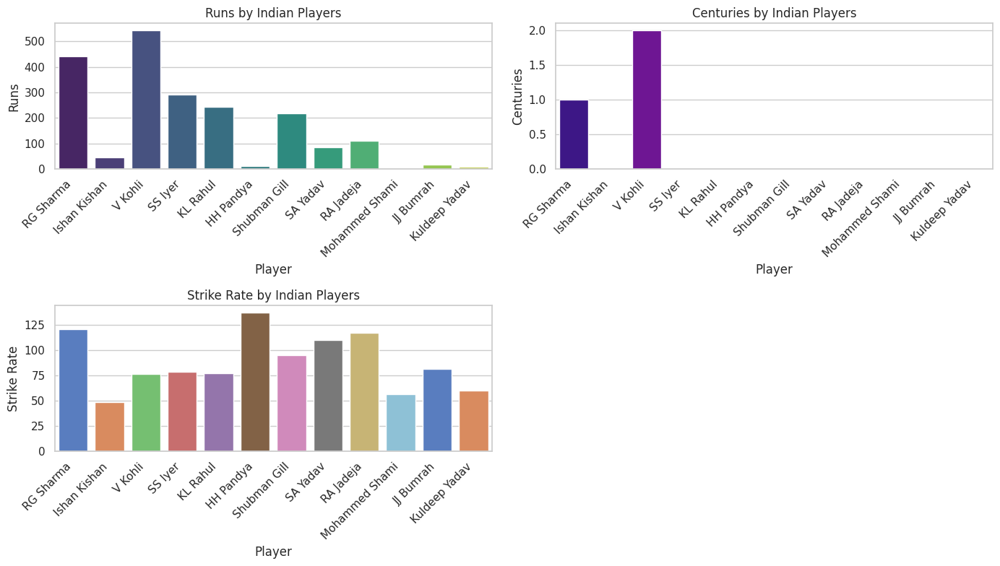

In [ ]:
plt.figure(figsize=(14, 8))

plt.subplot(2, 2, 1)
sns.barplot(x='player_name', y='runs', data=indian_batsman, palette='viridis')
plt.title('Runs by Indian Players')
plt.xlabel('Player')
plt.ylabel('Runs')
plt.xticks(rotation=45, ha='right')

plt.subplot(2, 2, 2)
sns.barplot(x='player_name', y='centuries', data=indian_batsman, palette='plasma')
plt.title('Centuries by Indian Players')
plt.xlabel('Player')
plt.ylabel('Centuries')
plt.xticks(rotation=45, ha='right')

plt.subplot(2, 2, 3)
sns.barplot(x='player_name', y='strike_rate', data=indian_batsman, palette='muted')
plt.title('Strike Rate by Indian Players')
plt.xlabel('Player')
plt.ylabel('Strike Rate')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()#To make it more presentable
plt.show()

Similarly, for South African Batsman

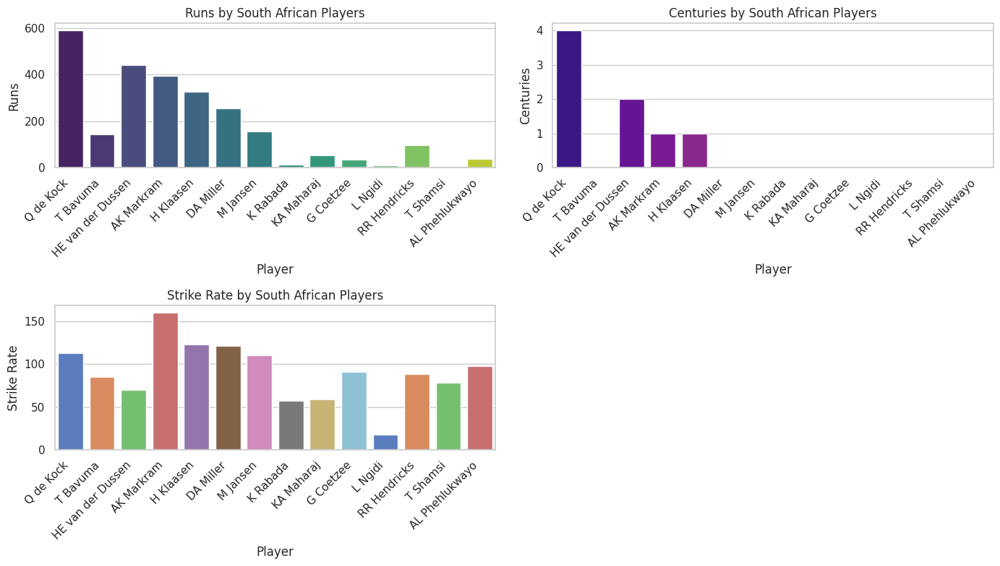

In [ ]:
plt.figure(figsize=(14, 8))

plt.subplot(2, 2, 1)
sns.barplot(x='player_name', y='runs', data=southAfrican_batsman, palette='viridis')
plt.title('Runs by South African Players')
plt.xlabel('Player')
plt.ylabel('Runs')
plt.xticks(rotation=45, ha='right')

plt.subplot(2, 2, 2)
sns.barplot(x='player_name', y='centuries', data=southAfrican_batsman, palette='plasma')
plt.title('Centuries by South African Players')
plt.xlabel('Player')
plt.ylabel('Centuries')
plt.xticks(rotation=45, ha='right')

plt.subplot(2, 2, 3)
sns.barplot(x='player_name', y='strike_rate', data=southAfrican_batsman, palette='muted')
plt.title('Strike Rate by South African Players')
plt.xlabel('Player')
plt.ylabel('Strike Rate')
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

#### Now we would look at the bowler's dataset i.e dataset 2

In [ ]:
df_overall_bowler.head(5)

,Unnamed: 0,team,innings,runs,balls,wickets,extras,average,strike_rate,economy,wicket_hauls
0,TA Boult,New Zealand,9,420,503,15,20,29.264550,37.444444,5.031440,0
1,MJ Henry,New Zealand,7,317,332,11,8,32.722222,32.250000,5.702410,0
2,MJ Santner,New Zealand,9,399,501,16,6,23.711111,34.246914,4.899798,1
3,JDS Neesham,New Zealand,3,157,89,2,4,33.666667,15.000000,12.060606,0
4,R Ravindra,New Zealand,8,334,354,5,3,48.843750,49.140625,5.949756,0


In [ ]:
df_overall_bowler.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98 entries, 0 to 97
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    98 non-null     object 
 1   team          98 non-null     object 
 2   innings       98 non-null     int64  
 3   runs          98 non-null     int64  
 4   balls         98 non-null     int64  
 5   wickets       98 non-null     int64  
 6   extras        98 non-null     int64  
 7   average       98 non-null     float64
 8   strike_rate   98 non-null     float64
 9   economy       98 non-null     float64
 10  wicket_hauls  98 non-null     int64  
dtypes: float64(3), int64(6), object(2)
memory usage: 8.5+ KB


From the data, it is clearly evident that the "Unnamed: 0" column contains names of the players

In [ ]:
df_overall_bowler.rename(columns = {'Unnamed: 0':'player_name'}, inplace=True)

In [ ]:
bowler_features = df_overall_bowler.columns.to_list()
bowler_features

['player_name',
 'team',
 'innings',
 'runs',
 'balls',
 'wickets',
 'extras',
 'average',
 'strike_rate',
 'economy',
 'wicket_hauls']

# Data Visualization - Bowlers

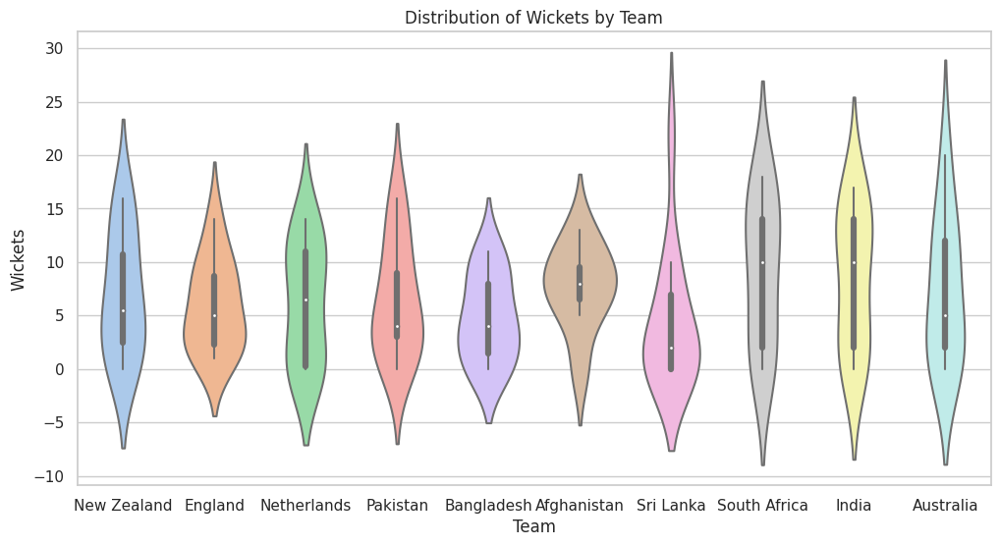

In [ ]:
# Violin Plot: Wickets by Team
plt.figure(figsize=(12, 6))
sns.violinplot(x='team', y='wickets', data=df_overall_bowler, palette='pastel')
plt.title('Distribution of Wickets by Team')
plt.xlabel('Team')
plt.ylabel('Wickets')
plt.show()

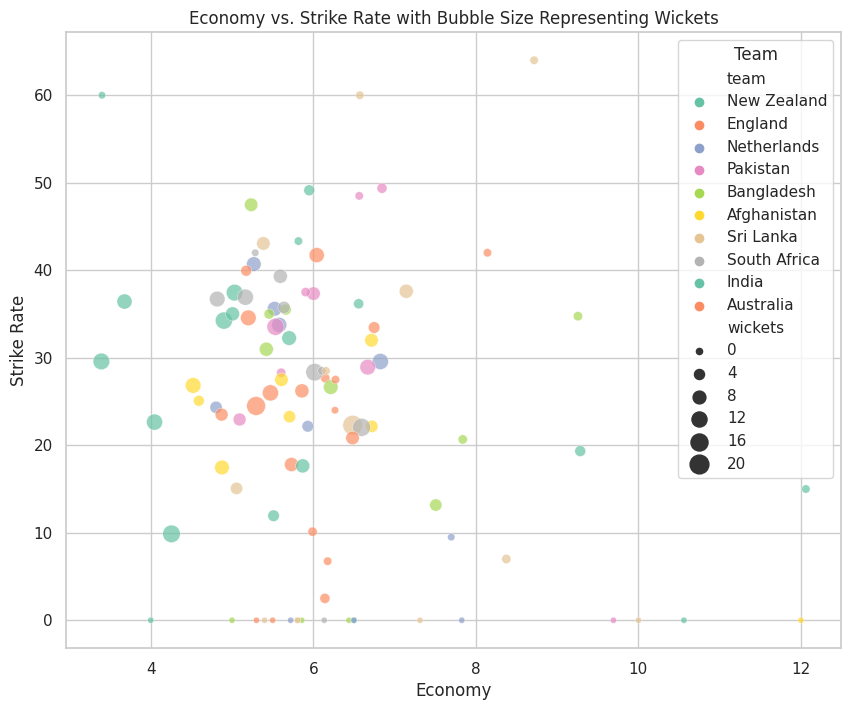

In [ ]:
# Scatterplot for Economy vs. Strike Rate with Bubble Size Representing Wickets
plt.figure(figsize=(10, 8))
sns.scatterplot(x='economy', y='strike_rate', size='wickets', data=df_overall_bowler, hue='team', sizes=(20, 200), palette='Set2', alpha=0.7)
plt.title('Economy vs. Strike Rate with Bubble Size Representing Wickets')
plt.xlabel('Economy')
plt.ylabel('Strike Rate')
plt.legend(title='Team')
plt.show()

As we need play in eleven team members for Team India and Team South Africa, we will do comparitive analysis between the bowlers of respective teams.

In [ ]:
indian_bowler = df_overall_bowler[df_overall_bowler['team']=='India']
southAfrican_bowler = df_overall_bowler[df_overall_bowler['team']=='South Africa']

In [ ]:
print(indian_bowler)
print(southAfrican_bowler)

       player_name   team  innings  runs  balls  wickets  extras    average  \
49       JJ Bumrah  India        8   236    398       15      18  17.452381   
50  Mohammed Siraj  India        8   329    376       10      25  25.275000   
51       HH Pandya  India        4   115    101        5       5  22.500000   
52        R Ashwin  India        1    34     60        1       0  34.000000   
53   Kuldeep Yadav  India        8   274    395       12       7  26.031250   
54       RA Jadeja  India        8   248    388       14       6  12.700000   
67       SN Thakur  India        3   102    104        2       2  40.333333   
75         V Kohli  India        1     2      3        0       0   0.000000   
82  Mohammed Shami  India        4   118    159       17       9   7.033333   

    strike_rate   economy  wicket_hauls  
49    29.583333  3.392168             1  
50    35.016667  5.006099             0  
51    19.333333  9.284091             0  
52    60.000000  3.400000             0  

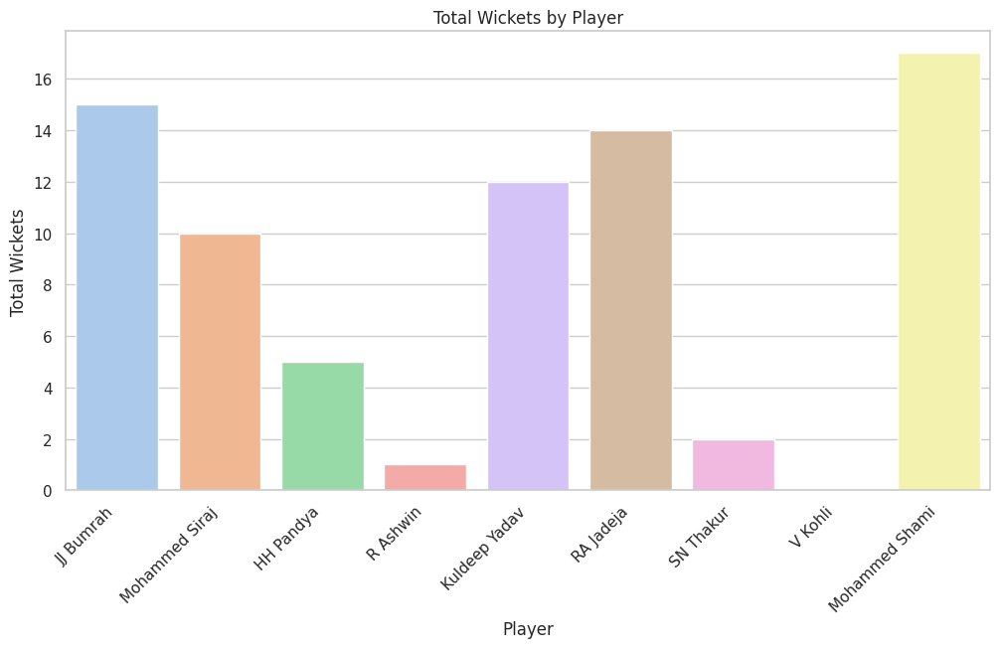

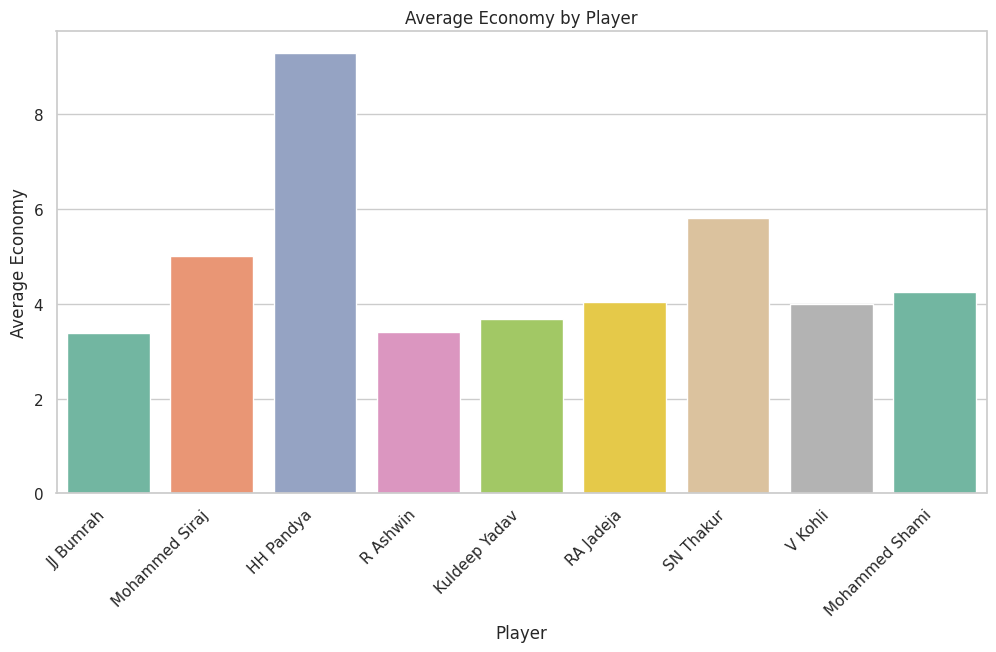

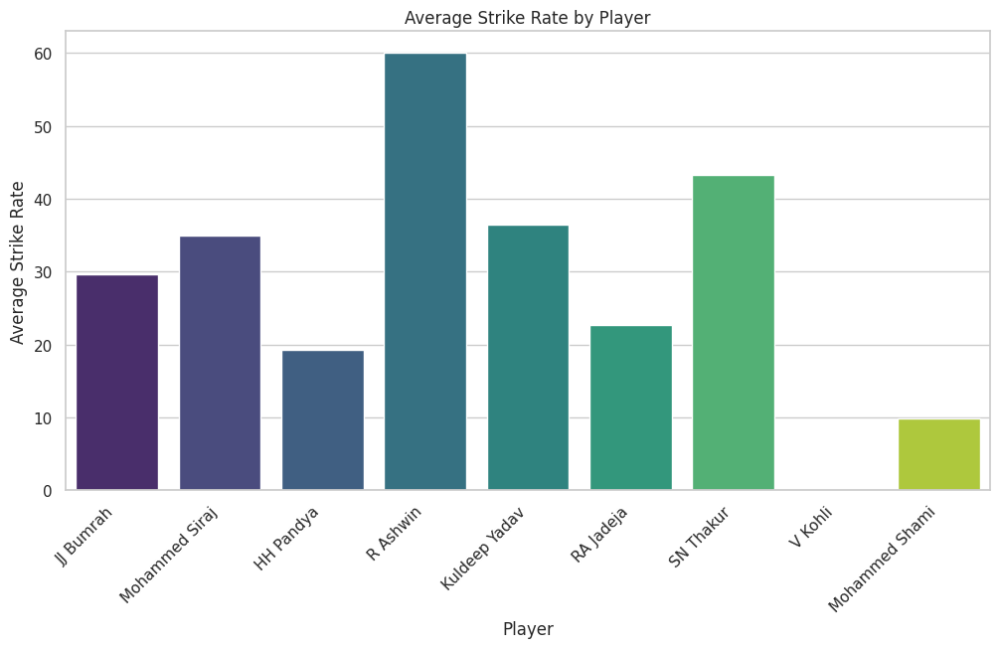

In [ ]:
#Total Wickets by Player
plt.figure(figsize=(12, 6))
sns.barplot(x='player_name', y='wickets', data=indian_bowler, palette='pastel')
plt.title('Total Wickets by Player')
plt.xlabel('Player')
plt.ylabel('Total Wickets')
plt.xticks(rotation=45, ha='right')
plt.show()

#Average Economy by Player
plt.figure(figsize=(12, 6))
sns.barplot(x='player_name', y='economy', data=indian_bowler, palette='Set2')
plt.title('Average Economy by Player')
plt.xlabel('Player')
plt.ylabel('Average Economy')
plt.xticks(rotation=45, ha='right')
plt.show()

#Average Strike Rate by Player
plt.figure(figsize=(12, 6))
sns.barplot(x='player_name', y='strike_rate', data=indian_bowler, palette='viridis')
plt.title('Average Strike Rate by Player')
plt.xlabel('Player')
plt.ylabel('Average Strike Rate')
plt.xticks(rotation=45, ha='right')
plt.show()

Similarly, for South African bowlers

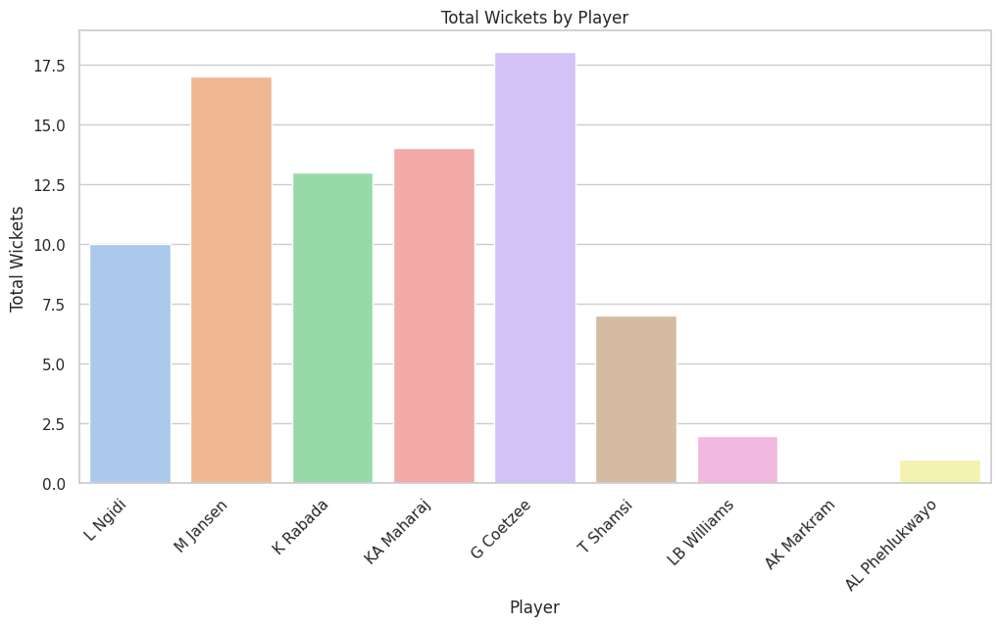

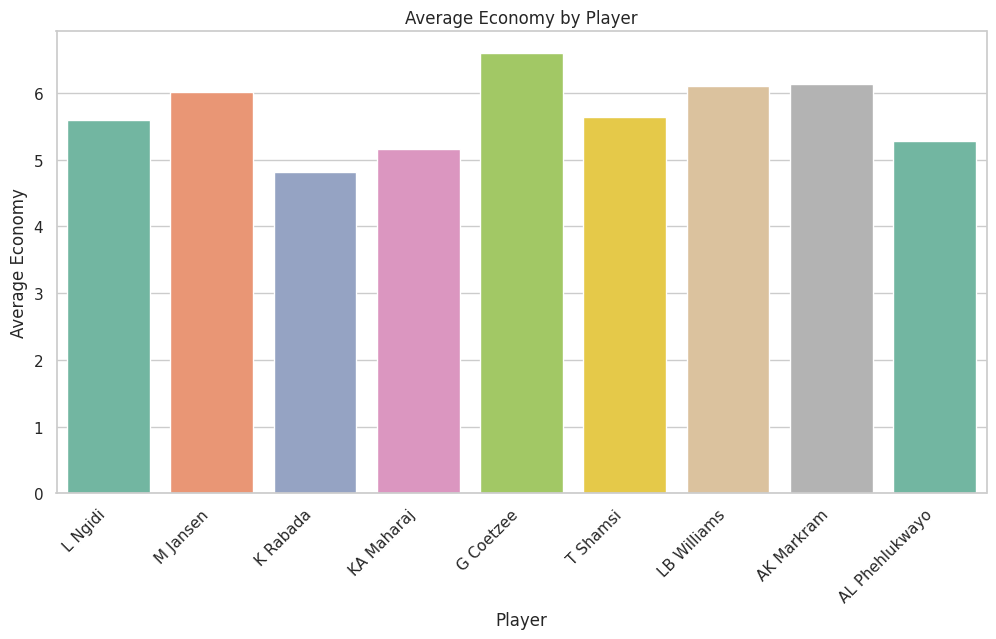

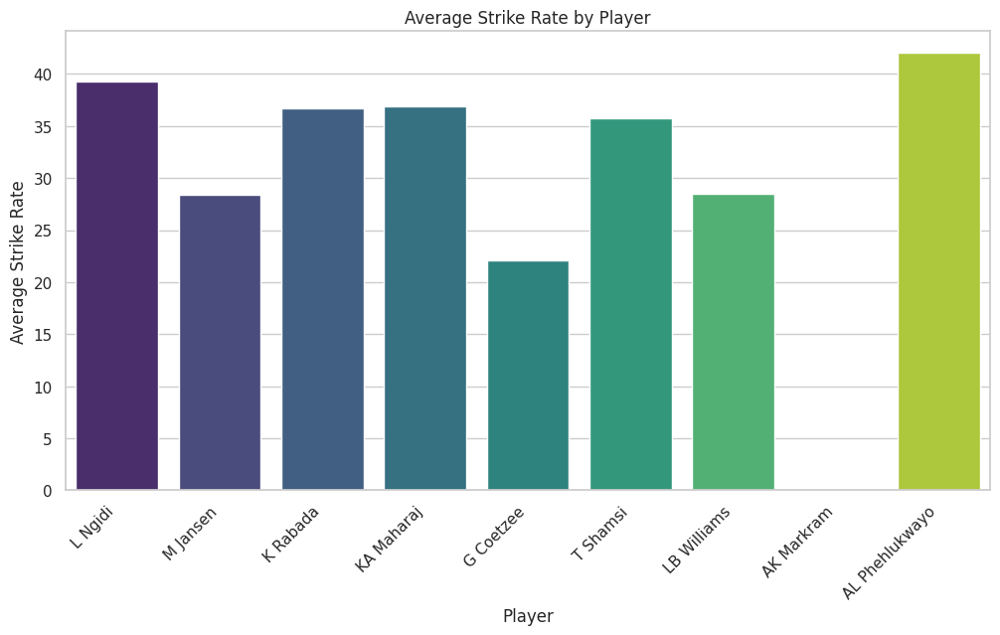

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x='player_name', y='wickets', data=southAfrican_bowler, palette='pastel')
plt.title('Total Wickets by Player')
plt.xlabel('Player')
plt.ylabel('Total Wickets')
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='player_name', y='economy', data=southAfrican_bowler, palette='Set2')
plt.title('Average Economy by Player')
plt.xlabel('Player')
plt.ylabel('Average Economy')
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='player_name', y='strike_rate', data=southAfrican_bowler, palette='viridis')
plt.title('Average Strike Rate by Player')
plt.xlabel('Player')
plt.ylabel('Average Strike Rate')
plt.xticks(rotation=45, ha='right')
plt.show()

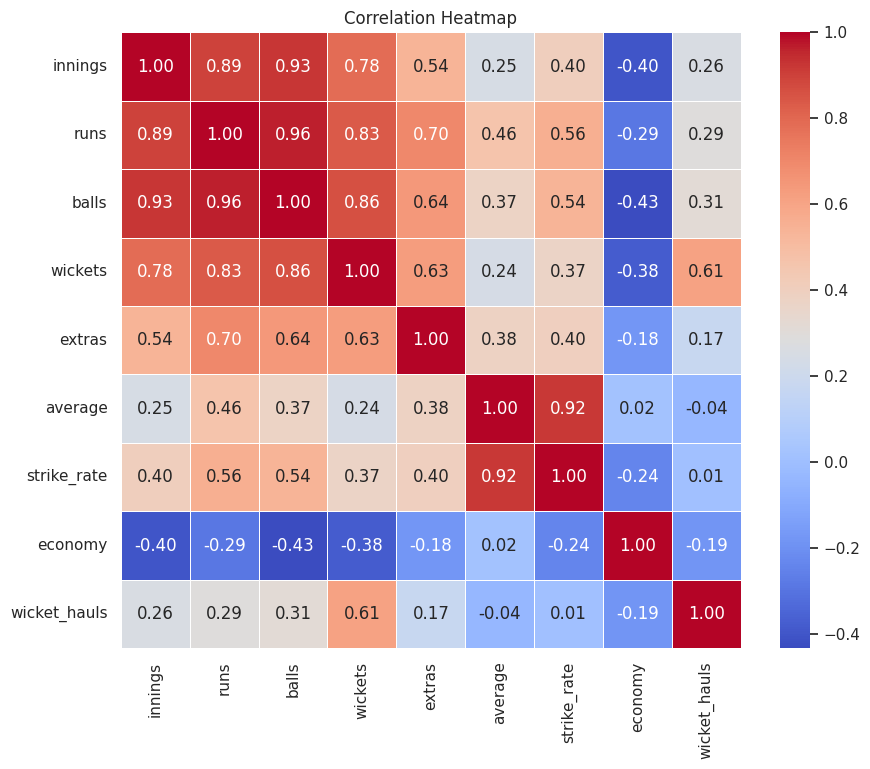

In [ ]:
# Heatmap for Correlation
plt.figure(figsize=(10, 8))
correlation_matrix = df_overall_bowler[['innings','runs','balls','wickets','extras','average','strike_rate','economy','wicket_hauls']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

Now, we will have to move towards figuring out how to choose the team for Finale. Looking through the visualizations make it quite clear which players to choose for the showdown. But, we would also try Machine Learning to predict the players which would be playing during the finals.

For that we would need features that are independent and known before. I have chosen name, team, opposition team, venue, player's rating as the features determining player's selection decision.

First step is to club and scrap relevant data from the dataset 1 and dataset 2 and populating it with missing data. (which we did manually)

In [ ]:
df1 = pd.read_excel("match_batsman_details.xlsx")
df1 = df1[['date','name', 'team', 'opposition', 'venue']]
dfInd = df1[df1['team']=='India']
dfSA =  df1[df1['team']== 'South Africa']
dfbat = pd.concat([dfInd,dfSA])

In [ ]:
df2 = pd.read_excel("match_bowler_details.xlsx")
df2 = df2[['date','name', 'team', 'opposition', 'venue']]
dfInd = df2[df2['team']=='India']
dfSA =  df2[df2['team']== 'South Africa']
dfbowl = pd.concat([dfInd,dfSA])

In [ ]:
df = pd.concat([dfbat,dfbowl]).drop_duplicates().reset_index(drop=True)
df.to_excel('player_list.xlsx')

Index(['date', 'name', 'team', 'opposition', 'venue'], dtype='object')

The above generated excel was populated with players rating(current) and his selection decision(past).

# Data Preprocessing

Before we move towards modelling, we will need to process the categorical values present in the dataset, for which we will use label encoding.
<br>
We will also create a map between original and encoded values which would help in information retrieval at later stage.



In [ ]:
df = pd.read_excel('player_list_edited.xlsx')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255 entries, 0 to 254
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date           255 non-null    object
 1   name           255 non-null    object
 2   team           255 non-null    object
 3   opposition     255 non-null    object
 4   venue          255 non-null    object
 5   player_rating  255 non-null    int64 
 6   selected       255 non-null    int64 
dtypes: int64(2), object(5)
memory usage: 14.1+ KB


Date was used to group and distinguish matches and plays no role in selection of players. Thus we will drop this column.

In [ ]:
df.drop(['date'], axis=1, inplace=True)

As we have categorical attributes, we will perform label encoding. And for our reference we are making a map of encoded values to the original values

In [ ]:
name_decoded, team_decoded, venue_decoded = df['name'], df['opposition'], df['venue']

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [ ]:
encoding_list = ['name' , 'opposition' , 'venue']
df[encoding_list] = df[encoding_list].apply(lambda col: le.fit_transform(col) + 1)

In [ ]:
name_encoded, team_encoded, venue_encoded = df['name'], df['opposition'], df['venue']

In [ ]:
name_map = {decoded: encoded for decoded, encoded in zip(name_decoded, name_encoded)}
team_map = {decoded: encoded for decoded, encoded in zip(team_decoded, team_encoded)}
venue_map = {decoded: encoded for decoded, encoded in zip(venue_decoded, venue_encoded)}

In [ ]:
print(f"Name mapping: {name_map}", end=' ')
print()
print(f"Team mapping: {team_map}", end=' ')
print()
print(f"Venue mapping: {venue_map}", end=' ')

Name mapping: {'Q de Kock': 19, 'T Bavuma': 28, 'HE van der Dussen': 6, 'AK Markram': 1, 'H Klaasen': 5, 'DA Miller': 3, 'M Jansen': 16, 'L Ngidi': 14, 'K Rabada': 10, 'KA Maharaj': 11, 'G Coetzee': 4, 'LB Williams': 15, 'T Shamsi': 29, 'AL Phehlukwayo': 2, 'RR Hendricks': 23, 'RG Sharma': 22, 'Ishan Kishan': 8, 'V Kohli': 30, 'SS Iyer': 26, 'KL Rahul': 12, 'HH Pandya': 7, 'JJ Bumrah': 9, 'Mohammed Siraj': 18, 'R Ashwin': 20, 'Kuldeep Yadav': 13, 'RA Jadeja': 21, 'Shubman Gill': 27, 'SN Thakur': 25, 'Mohammed Shami': 17, 'SA Yadav': 24} 
Team mapping: {'Sri Lanka': 10, 'Australia': 2, 'Afghanistan': 1, 'Pakistan': 8, 'Netherlands': 6, 'Bangladesh': 3, 'England': 4, 'New Zealand': 7, 'South Africa': 9, 'India': 5} 
Venue mapping: {'Arun Jaitley Stadium, Delhi': 1, 'MA Chidambaram Stadium, Chepauk, Chennai': 5, 'Bharat Ratna Shri Atal Bihari Vajpayee Ekana Cricket Stadium, Lucknow': 2, 'Narendra Modi Stadium, Ahmedabad': 7, 'Himachal Pradesh Cricket Association Stadium, Dharamsala': 4, '

In [ ]:
df['team'] = df['team'].map(team_map)

In [ ]:
df.sample(7)

,name,team,opposition,venue,player_rating,selected
177,25,5,4,2,463,0
94,12,5,3,6,623,1
194,2,9,7,6,359,0
65,9,5,8,7,654,1
158,11,9,8,5,694,1
105,19,9,4,8,771,1
83,11,9,6,4,694,1


## Modelling

As we've got the processed data, we would scale the data using standard scaling.

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
feature_list = ['name', 'team', 'opposition', 'venue', 'player_rating']

In [ ]:
X = df[feature_list]
y = df["selected"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=21)

In [ ]:
scaler = scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_train_scaled.shape, X_test_scaled.shape

((204, 5), (51, 5))

We would be using Random Forest Classifer for modelling and for its hyperparameter tuning, we would use Grid Search.

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
from sklearn.ensemble import RandomForestClassifier

randomForest = RandomForestClassifier(random_state = 21)
parameters = {'n_estimators': list(range(10, 60, 3)), 'max_depth': list(range(5, 15, 2)), 'max_features': ['sqrt', 'log2']}

RandomForest_Classifier = GridSearchCV(randomForest, parameters, n_jobs=20, verbose=0)
RandomForest_Classifier.fit(X_train_scaled, y_train)

GridSearchCV(estimator=RandomForestClassifier(random_state=21), n_jobs=20,
             param_grid={'max_depth': [5, 7, 9, 11, 13],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [10, 13, 16, 19, 22, 25, 28, 31, 34,
                                          37, 40, 43, 46, 49, 52, 55, 58]})

In [ ]:
best_model = RandomForest_Classifier.best_estimator_
best_param_RF = RandomForest_Classifier.best_params_
print("Best parameters are " , best_param_RF)

Best parameters are  {'max_depth': 11, 'max_features': 'sqrt', 'n_estimators': 34}


In [ ]:
y_train_predicted = best_model.predict(X_train_scaled)
y_predicted = best_model.predict(X_test_scaled)

Plotting Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix

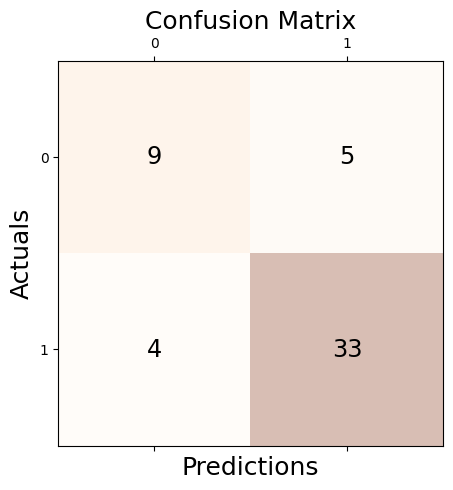

In [ ]:
conf_matrix = confusion_matrix(y_true=y_test, y_pred=y_predicted)

fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

Predicting Teams for Finale!

In [ ]:
# india = 5, South Africa = 9
india = df[df['team'] == 5][['name', 'player_rating']].drop_duplicates().reset_index(drop=True)
south_africa = df[df['team'] == 9][['name', 'player_rating']].drop_duplicates().reset_index(drop=True)

In [ ]:
# Narendra Modi Stadium, Ahmedabad = 7
india[['team', 'opposition', 'venue']] = [5, 9, 7]
south_africa[['team', 'opposition', 'venue']] = [9, 5, 7]

In [ ]:
india = india[['name', 'team', 'opposition', 'venue', 'player_rating']]
south_africa = south_africa[['name', 'team', 'opposition', 'venue', 'player_rating']]

In [ ]:
india_scaled = scaler.transform(india)
SA_scaled = scaler.transform(south_africa)

In [ ]:
india_pred = best_model.predict(india_scaled)
india_pred

array([1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1])

In [ ]:
south_africa_pred = best_model.predict(SA_scaled)
south_africa_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0])

In [ ]:
india['selected'] = india_pred.tolist()

In [ ]:
for nameEnc in india['name']:
  for names,value in name_map.items():
    if value==nameEnc:
      india['name'].replace([nameEnc], str(names),inplace=True)
team_india = india[india['selected']==1]['name']

In [ ]:
south_africa['selected'] = south_africa_pred.tolist()

In [ ]:
for nameEnc in south_africa['name']:
  for names,value in name_map.items():
    if value==nameEnc:
      south_africa['name'].replace([nameEnc], str(names),inplace=True)
team_southafrica = south_africa[south_africa['selected']==1]['name']

# Here we are with the final eleven names for each team.

In [ ]:
print(f"The play-in eleven of Team India is \n{team_india}")

The play-in eleven of Team India is 
0          RG Sharma
2            V Kohli
3            SS Iyer
4           KL Rahul
6          JJ Bumrah
7     Mohammed Siraj
9      Kuldeep Yadav
10         RA Jadeja
11      Shubman Gill
13    Mohammed Shami
14          SA Yadav
Name: name, dtype: object


In [ ]:
print(f"The play-in eleven of Team South Africa is \n{team_southafrica}")

The play-in eleven of Team South Africa is 
0             Q de Kock
1              T Bavuma
2     HE van der Dussen
3            AK Markram
4             H Klaasen
5             DA Miller
6              M Jansen
7               L Ngidi
8              K Rabada
9            KA Maharaj
10            G Coetzee
Name: name, dtype: object


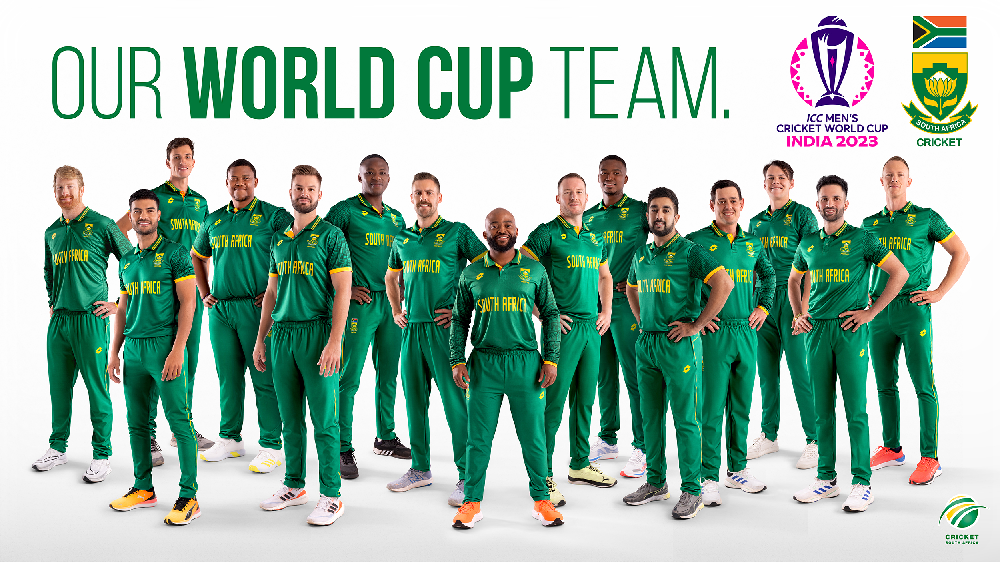